# OpenAI Embddig 활용하여 텍스트 임베딩하고 활용까지 해보기
---
- 원본 작성자 : AISchool ( https://www.udemy.com/course/llm-part-1-llama-2-fine-tuning/?referralCode=32804C68FEF005E82BCF )
- Ref : https://platform.openai.com/docs/guides/embeddings/use-cases
- 최종 수정일 : 2024-02-01

## 1. 임베딩 얻기(Obtaining the embeddings)

---

임베딩(Embedding)의 개념 자체가 이해되지 않는다면, 다음의 [문서]()를 참고하자.


colab 환경이라면 아래의 코드를 입력하자.
```
!pip install openai pandas transformers plotly matplotlib scikit-learn torch torchvision scipy tiktoken
```

로컬에서 작업중이면 [requirements.txt]()를 다운받아서 터미널 상에서 다운받자.

In [2]:
import pandas as pd
import tiktoken
from openai import OpenAI
import os
import dotenv
dotenv.load_dotenv()

from sklearn.manifold import TSNE


# 시각화 관련 라이브러리
import matplotlib
import matplotlib.pyplot as plt


import pandas as pd
from sklearn.manifold import TSNE
import numpy as np
from ast import literal_eval

# 머신러닝 라이브러리
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

# 코랩 환경에서 실행하고 있다면 os.getenv("OPENAI_API_KEY") 를 지우고 본인의 api key를 입력하면 된다  
API_KEY = os.getenv("OPENAI_API_KEY") # .env 파일에 있는 OPENAI_API_KEY를 가져온다


### 1-0. OpenAI API를 이용해서 Embedding을 수행하는 함수 정의
---
원본 코드에서는 ADA 2세대를 사용했었다. 작성 시점(2024년 2월)에는 OpenAI가 3세대 임베딩 벡터 모델을 내놓았으며, 비용도 small모델의 경우 ADA보다 훨씬 저렴하고, Large 모델도 ADA와 비용상 큰 차이가 없다. 

성능의 경우, Small 모델릉 ADA2보다 비슷하며, Large 모델의 경우 더 뛰어나다.

아무튼, 여기서는 ADA보다 훨씬 저렴하면서 비슷한 성능을 내는 3세대 small을 사용하도록 하겠다.

새로운 임베딩 모델에 대한 자세한 정보는 [문서]()를 참고하자.

In [3]:
from openai import OpenAI
client = OpenAI(api_key=API_KEY)

def get_embedding(text, model="text-embedding-3-small"):
   text = text.replace("\n", " ")
   return client.embeddings.create(input = [text], model=model).data[0].embedding

### 1-1. 리뷰 데이터셋 준비하기
---
- Reference : https://www.kaggle.com/datasets/snap/amazon-fine-food-reviews


openAI에서 Kaggle에 있는 데이터셋을 잘 잘라서 예시 데이터를 만들어놨다.
colab 이용자는 블럭을 추가해 아래 코드를 넣고, 로컬 이용자는 느낌표를 제외한 부분을 복붙해서 터미널에 입력하면 된다.

```
!wget https://raw.githubusercontent.com/openai/openai-cookbook/main/examples/data/fine_food_reviews_1k.csv -O fine_food_reviews_1k.csv
```


하지만, 여기선 한국어 리뷰를 임베딩 해보겠다.
- 링크 : 

한국어 식당리뷰로 진행해보겠다.

### 1-2. 데이터 전처리

---
- Rating은 감성분석에 대한 결과값으로, 1은 긍정, 0은 부정, 2는 모호함을 의미한다고 한다.

In [4]:
input_datapath = "kr3.tsv" 
ori_df = pd.read_csv(input_datapath, sep="\t")
ori_df = ori_df.dropna()

ori_df.head(2)

,Rating,Review
0,1,숙성 돼지고기 전문점입니다. 건물 모양 때문에 매장 모양도 좀 특이하지만 쾌적한 편...
1,1,고기가 정말 맛있었어요! 육즙이 가득 있어서 너무 좋았아요 일하시는 분들 너무 친절...


In [42]:
ori_df.shape

(641762, 2)

64만건이나 되는데, 이중에서 1000건만 사용해보겠다. 긍정/부정 비중이 다르므로 긍정 450개, 부정 450, 모호한 문장 100개를 뽑도록 한다.

In [5]:
pos = ori_df[ori_df["Rating"] == 1].head(450)
neg = ori_df[ori_df["Rating"] == 0].head(450) 
arg = ori_df[ori_df["Rating"] == 2].head(100)

df = pd.concat([pos, neg, arg], axis=0)
df.shape

(1000, 2)

### 1-3. 임베딩 진행
---
시간이 좀 걸린다.. 1000건 돌리는데 6분정도 걸린다.

In [6]:
df['embedding'] = df["Review"].apply(lambda x: get_embedding(x, model='text-embedding-3-small'))
df.to_csv('kr3-embedding.csv', index=False)

결과를 확인해보자

In [7]:
len(df.iloc[0]['embedding'])

1536

무려 1536개 차원에 임베딩됐다..

## 2. 2D로 데이터 시각화하기 (Data visualization in 2D)
---
현재 한 문장은 엄청나게 많은 차원으로 표현되어 있다. 이를 그대로 시각화 할 수는 없으니, 차원축소 알고리즘을 활용해 2차원으로 축소하고, 축소된 벡터를 다시 시각화하도록 하자.

In [19]:
# 임베딩 해둔 데이터를 불러온다
df = pd.read_csv('kr3-embedding.csv')

### 2-1. 임베딩 데이터를 2차원으로 변환하기
---
차원축소 알고리즘에는 대표적으로 PCA 라는 것이 있다. 다만, 여기서는 t-SNE 방식을 활용한다. t-SNE가 좀 더 데이터 특성을 잘 나타낸다고 한다.

**PCA**

In [20]:
# Convert to a list of lists of floats
df['embedding'] = df['embedding'].apply(eval).tolist()
matrix = np.array(df['embedding'].tolist())

# Create a t-SNE model and transform the data
tsne = TSNE(n_components=2, perplexity=15, random_state=42, init='random', learning_rate=200)
vis_dims = tsne.fit_transform(matrix)
vis_dims.shape

(1000, 2)

### 2-2. 시각화

Text(0.5, 1.0, 'Korean Restaurant Reviews visualized in language using t-SNE')

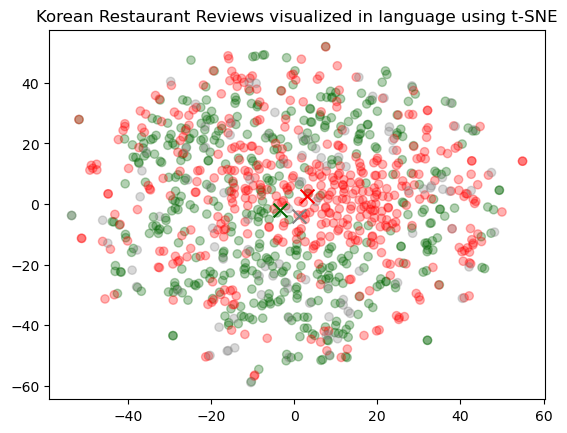

In [21]:
colors = ["red", "darkgreen", 'grey']
x = [x for x,y in vis_dims]
y = [y for x,y in vis_dims]
color_indices = df.Rating.values - 1

colormap = matplotlib.colors.ListedColormap(colors)
plt.scatter(x, y, c=color_indices, cmap=colormap, alpha=0.3)
for score in [0,1,2]:
    avg_x = np.array(x)[df.Rating==score].mean()
    avg_y = np.array(y)[df.Rating==score].mean()
    color = colors[score]
    plt.scatter(avg_x, avg_y, marker='x', color=color, s=100)

plt.title("Korean Restaurant Reviews visualized in language using t-SNE")

## 3. 임베딩 활용하기
---
- 활용한 데이터셋이 단순한 긍/부정 정도만 레이블링되어있기에 Regression은 건너뛰도록 한다.

###  3-1. 임베딩값을 feature로 분류 수행하기(Classification using the embedding features)

--- 

애매한 문장으로 분류된 것들을 제외하도록 한다. 이 문장들은 분류 모델 완성 후 재분류 해보도록 한다.

In [22]:
ambig = df[df["Rating"] == 2]
test_df = df[df["Rating"] != 2]

ambig.reset_index(inplace=True, drop = True)
test_df.reset_index(inplace=True, drop = True)

In [23]:
# split data into train and test
X_train, X_test, y_train, y_test = train_test_split(
    list(test_df.embedding.values), test_df.Rating, test_size=0.3, random_state=42
)

# train random forest classifier
clf = RandomForestClassifier(n_estimators=100)
clf.fit(X_train, y_train)
preds = clf.predict(X_test)
probas = clf.predict_proba(X_test)

report = classification_report(y_test, preds)
print(report)

              precision    recall  f1-score   support

           0       0.76      0.88      0.82       129
           1       0.87      0.75      0.81       141

    accuracy                           0.81       270
   macro avg       0.82      0.81      0.81       270
weighted avg       0.82      0.81      0.81       270



In [24]:
y_test

70     1
827    0
231    1
588    0
39     1
      ..
506    0
653    0
638    0
752    0
281    1
Name: Rating, Length: 270, dtype: int64

In [25]:
preds

array([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0,
       0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1,
       0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0,
       1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0,
       0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0,
       0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0,
       0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0,
       0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0,
       1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       0, 0, 0, 0, 0, 0], dtype=int64)

In [32]:
X_test

[[-0.037376146763563156,
  -0.03926489129662514,
  -0.04344111308455467,
  0.008730195462703705,
  0.014207553118467331,
  -0.0019556372426450253,
  0.013619943521916866,
  0.07374496757984161,
  0.016715385019779205,
  -0.046043384820222855,
  0.020293505862355232,
  -0.04776424169540405,
  0.0018389022443443537,
  0.013934734277427197,
  -0.020555831491947174,
  -0.01945406384766102,
  -0.0055245766416192055,
  -0.05120595172047615,
  -0.012937896884977818,
  -0.014301990158855915,
  0.04977890104055405,
  -0.0017746324883773923,
  -0.05666232481598854,
  0.03257034346461296,
  -0.030870473012328148,
  0.035529375076293945,
  -0.011573804542422295,
  0.05296877771615982,
  -0.030744556337594986,
  0.021049004048109055,
  -0.05792148783802986,
  0.0024986511562019587,
  0.02247605472803116,
  -0.019663924351334572,
  -0.007182474248111248,
  -0.008478362113237381,
  0.03899207338690758,
  0.025204241275787354,
  0.038467422127723694,
  -0.006836204323917627,
  -0.02671523578464985,
  

In [33]:
ambig.embedding.tolist()

[[-0.013573248870670795,
  -0.03248715400695801,
  -0.07219859957695007,
  -0.0343707911670208,
  -0.01599981263279915,
  -0.052076954394578934,
  0.026326561346650124,
  0.03986657038331032,
  0.0029030132573097944,
  -0.027833469212055206,
  -0.027833469212055206,
  0.032332032918930054,
  -0.0068254051730036736,
  -0.004681385587900877,
  -0.006138432305306196,
  0.04099675267934799,
  -0.037428926676511765,
  -0.0040581244975328445,
  0.04086378961801529,
  0.02202744409441948,
  0.013118959963321686,
  -0.03262011706829071,
  -0.018282335251569748,
  -0.011240866035223007,
  0.022404169663786888,
  0.030980248004198074,
  -0.0035456649493426085,
  0.005321267526596785,
  0.036498188972473145,
  -0.0009404322481714189,
  -0.035611771047115326,
  -0.032420672476291656,
  0.010836438275873661,
  -0.06275826692581177,
  0.047999437898397446,
  -0.007650880143046379,
  0.03408270329236984,
  -0.01674218662083149,
  -0.021994203329086304,
  -0.01653166301548481,
  0.01306355930864811,
 

In [34]:
ambig_preds = clf.predict(ambig.embedding.tolist())
ambig_probas = clf.predict_proba(ambig.embedding.tolist())


In [35]:
ambig_preds

array([1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1,
       0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1,
       1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0], dtype=int64)

In [42]:
ambig["Review"].iloc[4]

'찹쌀순대 좋아해서 가는 곳, 동네에선 예전부터 유명했던 곳이다. 사실 맛이 특별하게 맛있지는 않다 맛없지도 않고 먹을만한 곳. 지금이야 여러 순댓국 체인이 생겨서 순댓국 맛이 보편화되어 있기 때문에 더욱 이곳이 특별한 이유를 찾기 힘들어졌다'

In [ ]:
from sklearn.metrics import average_precision_score, precision_recall_curve

def plot_multiclass_precision_recall(
    y_score, y_true_untransformed, class_list, classifier_name
):
    """
    Precision-Recall plotting for a multiclass problem. It plots average precision-recall, per class precision recall and reference f1 contours.

    Code slightly modified, but heavily based on https://scikit-learn.org/stable/auto_examples/model_selection/plot_precision_recall.html
    """
    n_classes = len(class_list)
    y_true = pd.concat(
        [(y_true_untransformed == class_list[i]) for i in range(n_classes)], axis=1
    ).values

    # For each class
    precision = dict()
    recall = dict()
    average_precision = dict()
    for i in range(n_classes):
        precision[i], recall[i], _ = precision_recall_curve(y_true[:, i], y_score[:, i])
        average_precision[i] = average_precision_score(y_true[:, i], y_score[:, i])

    # A "micro-average": quantifying score on all classes jointly
    precision_micro, recall_micro, _ = precision_recall_curve(
        y_true.ravel(), y_score.ravel()
    )
    average_precision_micro = average_precision_score(y_true, y_score, average="micro")
    print(
        str(classifier_name)
        + " - Average precision score over all classes: {0:0.2f}".format(
            average_precision_micro
        )
    )

    # setup plot details
    plt.figure(figsize=(9, 10))
    f_scores = np.linspace(0.2, 0.8, num=4)
    lines = []
    labels = []
    for f_score in f_scores:
        x = np.linspace(0.01, 1)
        y = f_score * x / (2 * x - f_score)
        (l,) = plt.plot(x[y >= 0], y[y >= 0], color="gray", alpha=0.2)
        plt.annotate("f1={0:0.1f}".format(f_score), xy=(0.9, y[45] + 0.02))

    lines.append(l)
    labels.append("iso-f1 curves")
    (l,) = plt.plot(recall_micro, precision_micro, color="gold", lw=2)
    lines.append(l)
    labels.append(
        "average Precision-recall (auprc = {0:0.2f})" "".format(average_precision_micro)
    )

    for i in range(n_classes):
        (l,) = plt.plot(recall[i], precision[i], lw=2)
        lines.append(l)
        labels.append(
            "Precision-recall for class `{0}` (auprc = {1:0.2f})"
            "".format(class_list[i], average_precision[i])
        )

    fig = plt.gcf()
    fig.subplots_adjust(bottom=0.25)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title(f"{classifier_name}: Precision-Recall curve for each class")
    plt.legend(lines, labels)

RandomForestClassifier() - Average precision score over all classes: 0.87


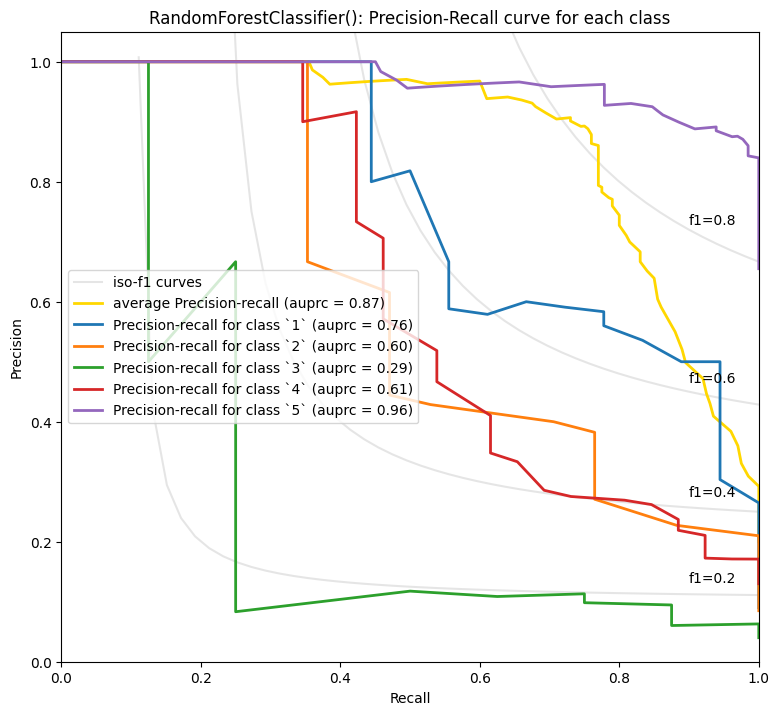

In [ ]:
plot_multiclass_precision_recall(probas, y_test, [1, 2, 3, 4, 5], clf)

### 3-3. 제로샷 분류(Zero-shot classification)

In [ ]:
import pandas as pd
import numpy as np
from ast import literal_eval

from sklearn.metrics import classification_report

# parameters
EMBEDDING_MODEL = "text-embedding-ada-002"

# load data
datafile_path = "./embedded_1k_reviews.csv"

df = pd.read_csv(datafile_path)
df["embedding"] = df.ada_embedding.apply(literal_eval).apply(np.array)

# convert 5-star rating to binary sentiment
df = df[df.Score != 3]
df["sentiment"] = df.Score.replace({1: "negative", 2: "negative", 4: "positive", 5: "positive"})

<ipython-input-23-917ee8d814a9>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["sentiment"] = df.Score.replace({1: "negative", 2: "negative", 4: "positive", 5: "positive"})


In [ ]:
df

,Time,ProductId,UserId,Score,Summary,Text,combined,ada_embedding,embedding,sentiment
0,1351123200,B003XPF9BO,A3R7JR3FMEBXQB,5,where does one start...and stop... with a tre...,Wanted to save some to bring to my Chicago fam...,Title: where does one start...and stop... wit...,"[0.007060592994093895, -0.02732112631201744, 0...","[0.007060592994093895, -0.02732112631201744, 0...",positive
1,1351123200,B003JK537S,A3JBPC3WFUT5ZP,1,Arrived in pieces,"Not pleased at all. When I opened the box, mos...",Title: Arrived in pieces; Content: Not pleased...,"[-0.023609420284628868, -0.011784634552896023,...","[-0.023609420284628868, -0.011784634552896023,...",negative
2,1351123200,B000JMBE7M,AQX1N6A51QOKG,4,"It isn't blanc mange, but isn't bad . . .",I'm not sure that custard is really custard wi...,"Title: It isn't blanc mange, but isn't bad . ....","[0.00016697357932571322, 0.005226491950452328,...","[0.00016697357932571322, 0.005226491950452328,...",positive
4,1351123200,B001BORBHO,A1AFOYZ9HSM2CZ,5,Happy with the product,My dog was suffering with itchy skin. He had ...,Title: Happy with the product; Content: My dog...,"[0.015255776233971119, -0.003898625960573554, ...","[0.015255776233971119, -0.003898625960573554, ...",positive
5,1351123200,B008PSM0BQ,A3OUFIMGL2K6RS,4,Good Sauce,This is a good all purpose sauce. Has good fl...,Title: Good Sauce; Content: This is a good all...,"[-0.016170555725693703, 0.005940747447311878, ...","[-0.016170555725693703, 0.005940747447311878, ...",positive
...,...,...,...,...,...,...,...,...,...,...
995,1351209600,B004OQLIHK,AKHQMSUORSA91,5,Delicious!,I have ordered these raisins multiple times. ...,Title: Delicious!; Content: I have ordered the...,"[-0.008766233921051025, -0.01863405480980873, ...","[-0.008766233921051025, -0.01863405480980873, ...",positive
996,1351209600,B0006349W6,A21BT40VZCCYT4,5,Good Training Treat,My dog will come in from outside when I am tra...,Title: Good Training Treat; Content: My dog wi...,"[-0.024528082460165024, -0.017596233636140823,...","[-0.024528082460165024, -0.017596233636140823,...",positive
997,1351209600,B00611F084,A6D4ND3C3BCYV,5,Jamica Me Crazy Coffee,Wolfgang Puck's Jamaica Me Crazy is that wonde...,Title: Jamica Me Crazy Coffee; Content: Wolfga...,"[-0.016790105029940605, -0.005199245177209377,...","[-0.016790105029940605, -0.005199245177209377,...",positive
998,1351209600,B005QKH5HA,A3LR9HCV3D96I3,5,Party Peanuts,Great product for the price. Mix with the Asia...,Title: Party Peanuts; Content: Great product f...,"[-0.010757419280707836, -0.016502324491739273,...","[-0.010757419280707836, -0.016502324491739273,...",positive


#### 3-3-1. cosine similarity 정의

In [ ]:
def cosine_similarity(a, b):
    return np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))

0      positive
1      negative
2      negative
4      positive
5      positive
         ...   
995    positive
996    positive
997    positive
998    positive
999    positive
Name: embedding, Length: 925, dtype: object
0      positive
1      negative
2      positive
4      positive
5      positive
         ...   
995    positive
996    positive
997    positive
998    positive
999    positive
Name: sentiment, Length: 925, dtype: object
              precision    recall  f1-score   support

    negative       0.61      0.88      0.72       136
    positive       0.98      0.90      0.94       789

    accuracy                           0.90       925
   macro avg       0.79      0.89      0.83       925
weighted avg       0.92      0.90      0.91       925



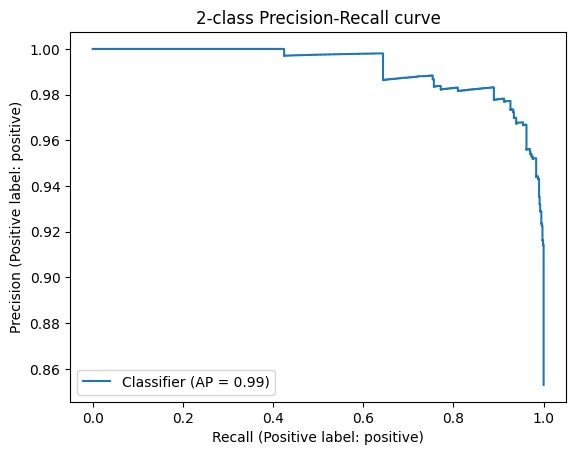

In [ ]:
from sklearn.metrics import PrecisionRecallDisplay

def evaluate_embeddings_approach(
    labels = ['negative', 'positive'],
    model = EMBEDDING_MODEL,
):
    label_embeddings = [get_embedding(label, model=model) for label in labels]

    # 값이 크면 positive에 가까움 값이 작으면 negative에 가까움
    def label_score(review_embedding, label_embeddings):
        return cosine_similarity(review_embedding, label_embeddings[1]) - cosine_similarity(review_embedding, label_embeddings[0])

    probas = df["embedding"].apply(lambda x: label_score(x, label_embeddings))
    preds = probas.apply(lambda x: 'positive' if x>0 else 'negative')

    report = classification_report(df.sentiment, preds)
    print(preds)
    print(df.sentiment)
    print(report)

    display = PrecisionRecallDisplay.from_predictions(df.sentiment, probas, pos_label='positive')
    _ = display.ax_.set_title("2-class Precision-Recall curve")

evaluate_embeddings_approach(labels=['negative', 'positive'], model=EMBEDDING_MODEL)

#### 3-3-2. 제로샷 성능 개선하기

0      positive
1      negative
2      positive
4      positive
5      positive
         ...   
995    positive
996    positive
997    positive
998    positive
999    positive
Name: embedding, Length: 925, dtype: object
0      positive
1      negative
2      positive
4      positive
5      positive
         ...   
995    positive
996    positive
997    positive
998    positive
999    positive
Name: sentiment, Length: 925, dtype: object
              precision    recall  f1-score   support

    negative       0.98      0.73      0.84       136
    positive       0.96      1.00      0.98       789

    accuracy                           0.96       925
   macro avg       0.97      0.86      0.91       925
weighted avg       0.96      0.96      0.96       925



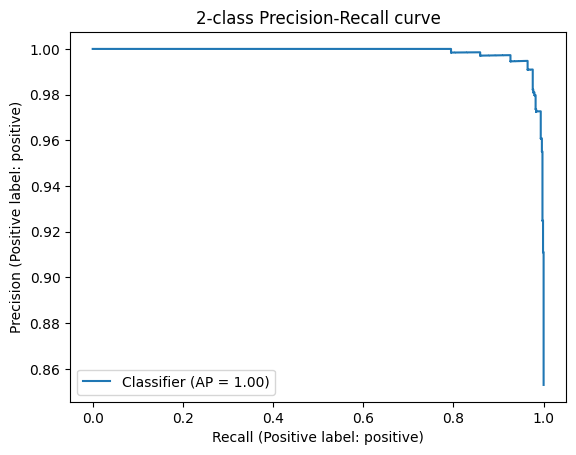

In [ ]:
evaluate_embeddings_approach(labels=['An Amazon review with a negative sentiment.', 'An Amazon review with a positive sentiment.'])

### 3-4. 클러스터링(Clustering)

In [ ]:
import numpy as np
import pandas as pd
from ast import literal_eval

# load data
datafile_path = "./embedded_1k_reviews.csv"

df = pd.read_csv(datafile_path)
df["embedding"] = df.ada_embedding.apply(literal_eval).apply(np.array)  # convert string to numpy array
matrix = np.vstack(df.embedding.values)
matrix.shape

(1000, 1536)

In [ ]:
from sklearn.cluster import KMeans

n_clusters = 4

kmeans = KMeans(n_clusters=n_clusters, init="k-means++", random_state=42)
kmeans.fit(matrix)
labels = kmeans.labels_
df["Cluster"] = labels

df.groupby("Cluster").Score.mean().sort_values()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster
2    4.081560
1    4.191176
0    4.221805
3    4.344937
Name: Score, dtype: float64

In [ ]:
df

,Time,ProductId,UserId,Score,Summary,Text,combined,ada_embedding,embedding,Cluster
0,1351123200,B003XPF9BO,A3R7JR3FMEBXQB,5,where does one start...and stop... with a tre...,Wanted to save some to bring to my Chicago fam...,Title: where does one start...and stop... wit...,"[0.007060592994093895, -0.02732112631201744, 0...","[0.007060592994093895, -0.02732112631201744, 0...",2
1,1351123200,B003JK537S,A3JBPC3WFUT5ZP,1,Arrived in pieces,"Not pleased at all. When I opened the box, mos...",Title: Arrived in pieces; Content: Not pleased...,"[-0.023609420284628868, -0.011784634552896023,...","[-0.023609420284628868, -0.011784634552896023,...",2
2,1351123200,B000JMBE7M,AQX1N6A51QOKG,4,"It isn't blanc mange, but isn't bad . . .",I'm not sure that custard is really custard wi...,"Title: It isn't blanc mange, but isn't bad . ....","[0.00016697357932571322, 0.005226491950452328,...","[0.00016697357932571322, 0.005226491950452328,...",3
3,1351123200,B004AHGBX4,A2UY46X0OSNVUQ,3,These also have SALT and it's not sea salt.,I like the fact that you can see what you're g...,Title: These also have SALT and it's not sea s...,"[0.010522457771003246, -0.013484964147210121, ...","[0.010522457771003246, -0.013484964147210121, ...",3
4,1351123200,B001BORBHO,A1AFOYZ9HSM2CZ,5,Happy with the product,My dog was suffering with itchy skin. He had ...,Title: Happy with the product; Content: My dog...,"[0.015255776233971119, -0.003898625960573554, ...","[0.015255776233971119, -0.003898625960573554, ...",1
...,...,...,...,...,...,...,...,...,...,...
995,1351209600,B004OQLIHK,AKHQMSUORSA91,5,Delicious!,I have ordered these raisins multiple times. ...,Title: Delicious!; Content: I have ordered the...,"[-0.008766233921051025, -0.01863405480980873, ...","[-0.008766233921051025, -0.01863405480980873, ...",2
996,1351209600,B0006349W6,A21BT40VZCCYT4,5,Good Training Treat,My dog will come in from outside when I am tra...,Title: Good Training Treat; Content: My dog wi...,"[-0.024528082460165024, -0.017596233636140823,...","[-0.024528082460165024, -0.017596233636140823,...",1
997,1351209600,B00611F084,A6D4ND3C3BCYV,5,Jamica Me Crazy Coffee,Wolfgang Puck's Jamaica Me Crazy is that wonde...,Title: Jamica Me Crazy Coffee; Content: Wolfga...,"[-0.016790105029940605, -0.005199245177209377,...","[-0.016790105029940605, -0.005199245177209377,...",0
998,1351209600,B005QKH5HA,A3LR9HCV3D96I3,5,Party Peanuts,Great product for the price. Mix with the Asia...,Title: Party Peanuts; Content: Great product f...,"[-0.010757419280707836, -0.016502324491739273,...","[-0.010757419280707836, -0.016502324491739273,...",2


Text(0.5, 1.0, 'Clusters identified visualized in language 2d using t-SNE')

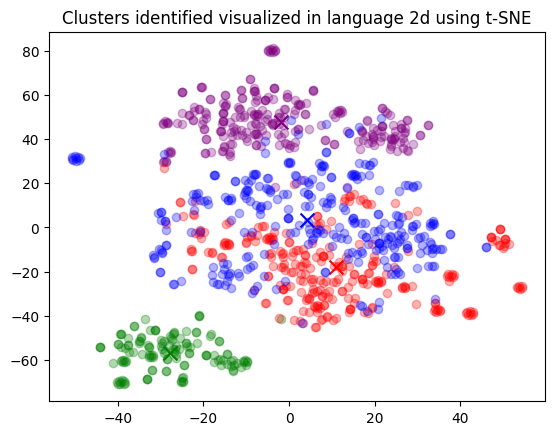

In [ ]:
from sklearn.manifold import TSNE
import matplotlib
import matplotlib.pyplot as plt

tsne = TSNE(n_components=2, perplexity=15, random_state=42, init="random", learning_rate=200)
vis_dims2 = tsne.fit_transform(matrix)

x = [x for x, y in vis_dims2]
y = [y for x, y in vis_dims2]

for category, color in enumerate(["purple", "green", "red", "blue"]):
    xs = np.array(x)[df.Cluster == category]
    ys = np.array(y)[df.Cluster == category]
    plt.scatter(xs, ys, color=color, alpha=0.3)

    avg_x = xs.mean()
    avg_y = ys.mean()

    plt.scatter(avg_x, avg_y, marker="x", color=color, s=100)
plt.title("Clusters identified visualized in language 2d using t-SNE")

In [ ]:
# Reading a review which belong to each group.
rev_per_cluster = 5

for i in range(n_clusters):
    print(f"Cluster {i}\n", end=" ")

    sample_cluster_rows = df[df.Cluster == i].sample(rev_per_cluster, random_state=42)
    for j in range(rev_per_cluster):
        print(sample_cluster_rows.Score.values[j], end=", ")
        print(sample_cluster_rows.Summary.values[j], end=":   ")
        print(sample_cluster_rows.Text.values[j])

    print("-" * 100)

Cluster 0
 5, breakfast tea:   We switch to this decaf tea at night for a great cup of tea and no sleep problems. Thanks for a good cup of tea.
5, It is awesome.:   My partner is very happy with the tea, and is feeling much better since starting to drink it.<br />She has been drinking it both hot (normal) and iced (chilled) and likes the refreshing nature of it.
4, Chike!:   Just tried the orange and iced coffee this morning and really liked them both!  I am going to place my order today!
5, FAVORITE tea...:   Lipton makes the BEST French Vanilla tea...I have tried others and this is my favorite.  Just the right balance in the vanilla flavoring.  I buy it by the case as it is hard to find in stores - thankful Amazon is carrying.  LOVE this tea!
5, Twinings---a good cup of tea:   I have been drinking Twining's tea for years.  It used to be made in England but now they have a plant in North Carolina for the American trade.  The tea is excellent. I drink the decaf for health reasons and f

### 3-5. 임베딩을 이용한 텍스트 검색(Semantic text search using embeddings)

In [ ]:
import pandas as pd
import numpy as np
from ast import literal_eval

datafile_path = "./embedded_1k_reviews.csv"

df = pd.read_csv(datafile_path)
df["embedding"] = df.ada_embedding.apply(literal_eval).apply(np.array)

In [ ]:
# search through the reviews for a specific product
def search_reviews(df, product_description, n=3, pprint=True):
    product_embedding = get_embedding(
        product_description,
        model="text-embedding-ada-002"
    )
    df["similarity"] = df.embedding.apply(lambda x: cosine_similarity(x, product_embedding))

    results = (
        df.sort_values("similarity", ascending=False)
        .head(n)
        .combined.str.replace("Title: ", "")
        .str.replace("; Content:", ": ")
    )
    if pprint:
        for r in results:
            print(r)
            print()
    return results


results = search_reviews(df, "delicious beans", n=3)

Good Buy:  I liked the beans. They were vacuum sealed, plump and moist. Would recommend them for any use. I personally split and stuck them in some vodka to make vanilla extract. Yum!

Jamaican Blue beans:  Excellent coffee bean for roasting. Our family just purchased another 5 pounds for more roasting. Plenty of flavor and mild on acidity when roasted to a dark brown bean and before any oil appears on the bean itself (455F @ 17 minutes).

Delicious!:  I enjoy this white beans seasoning, it gives a rich flavor to the beans I just love it, my mother in law didn't know about this Zatarain's brand and now she is traying different seasoning and she likes it very much.<br />Thank you Amazon for having it because now I can't find it in stores, I like to have this 12 boxes because I can made it whenever my family want it.



In [ ]:
results = search_reviews(df, "whole wheat pasta", n=3)

Tasty and Quick Pasta:  Barilla Whole Grain Fusilli with Vegetable Marinara is tasty and has an excellent chunky vegetable marinara.  I just wish there was more of it.  If you aren't starving or on a diet, the 9oz serving is enough for lunch although you might want to add a piece of fruit to feel full.  The whole grain fusilli cooked to al dente tenderness following the instructions and the chunky marinara sauce is so good that I wished there was more of it.  Rarely do I eat sauce alone but this sauce is good enough to.

sooo good:  tastes so good. Worth the money. My boyfriend hates wheat pasta and LOVES this. cooks fast tastes great.I love this brand and started buying more of their pastas. Bulk is best.

Handy:  Love the idea of ready in a minute pasta and for that alone this product gets praise.  The pasta is whole grain so that's a big plus and it actually comes out al dente.  The vegetable marinara sauce is tasty, but has a high salt content - 710mg for a 9 oz. serving.<br /><br 